https://www.tensorflow.org/tfmodels/vision/object_detection

https://public.roboflow.com/object-detection/aquarium

## Install necessary dependencies

In [ ]:
!pip install -U -q "tf-models-official"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 26.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.6/106.6 kB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 4.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.5/242.5 kB 20.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 55.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.8/589.8 MB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 58.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 34.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 56.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 67.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 39.0 MB/s eta 0:00:00


## Import required libraries

In [ ]:
import os
import io
import pprint
import tempfile
import matplotlib
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from PIL import Image
from six import BytesIO
from IPython import display
from urllib.request import urlopen

## Import required libraries from tensorflow models

In [ ]:
import orbit
import tensorflow_models as tfm

from official.core import exp_factory
from official.core import config_definitions as cfg
from official.vision.serving import export_saved_model_lib
from official.vision.ops.preprocess_ops import normalize_image
from official.vision.ops.preprocess_ops import resize_and_crop_image
from official.vision.utils.object_detection import visualization_utils
from official.vision.dataloaders.tf_example_decoder import TfExampleDecoder

pp = pprint.PrettyPrinter(indent=4) # Set Pretty Print Indentation
print(tf.__version__) # Check the version of tensorflow used

%matplotlib inline

2.16.1


### Prepare Data
- Convert Train, Validation & Test dataset to TF Resort

In [ ]:
#Start by connecting gdrive into the google colab
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
#!curl -L "https://public.roboflow.com/ds/ZpYLqHeT0W?key=ZXfZLRnhsc"> "./BCCD.v1-bccd.coco.zip"

#!unzip -q -o './BCCD.v1-bccd.coco.zip' -d './BCC.v1-bccd.coco/'

#!rm './BCCD.v1-bccd.coco.zip'

#/content/Aquarium

!unzip -q -o '/content/gdrive/MyDrive/Dataset/Aquarium Combined.v2-raw-1024.coco.zip' -d './Aquarium'

### CLI command to convert data(train data)

In [ ]:
TRAIN_DATA_DIR='./Aquarium/train'
TRAIN_ANNOTATION_FILE_DIR='./Aquarium/train/_annotations.coco.json'
OUTPUT_TFRECORD_TRAIN='./aquarium_tfrecords/train'

!echo $TRAIN_ANNOTATION_FILE_DIR
print(os.path.exists(TRAIN_ANNOTATION_FILE_DIR))

# Need to provide
# 1. image_dir: where images are present
# 2. object_annotations_file: where annotations are listed in json format
# 3. output_file_prefix: where to write output convered TFRecords files

!python -m official.vision.data.create_coco_tf_record --logtostderr \
  --image_dir=$TRAIN_DATA_DIR \
  --object_annotations_file=$TRAIN_ANNOTATION_FILE_DIR \
  --output_file_prefix=$OUTPUT_TFRECORD_TRAIN \
  --num_shards=1

./Aquarium/train/_annotations.coco.json
True
2024-03-18 03:02:53.094964: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
I0318 03:02:55.631162 140226332578944 create_coco_tf_record.py:502] writing to output path: ./aquarium_tfrecords/train
I0318 03:02:55.653593 140226332578944 create_coco_tf_record.py:374] Building bounding box index.
I0318 03:02:55.654310 140226332578944 create_coco_tf_record.py:385] 1 images are missing bboxes.
I0318 03:02:56.151755 140226332578944 tfrecord_lib.py:168] On image 0
I0318 03:02:56.175168 140226332578944 tfrecord_lib.py:168] On image 100
I0318 03:02:56.190558 140226332578944 tfrecord_lib.py:168] On image 200
I0318 03:02:56.205687 140226332578944 tfrecord_lib.py:168] On image 300
I0318 03:02:56.222146 140226332578944 tfrecord_lib.py:168] On image 400
I0318 03:02:56.245349 140226332578944 tfrecord_lib.py:180] Finished writing, skipped 0 annotations.
I0318 03:02:56.248928 140226332578944 create_coco_tf_record.

### CLI command to convert data(validation data)

In [ ]:
VALID_DATA_DIR='./Aquarium/valid'
VALID_ANNOTATION_FILE_DIR='./Aquarium/valid/_annotations.coco.json'
OUTPUT_TFRECORD_VALID='./aquarium_tfrecords/valid'

!python -m official.vision.data.create_coco_tf_record --logtostderr \
  --image_dir=$VALID_DATA_DIR \
  --object_annotations_file=$VALID_ANNOTATION_FILE_DIR \
  --output_file_prefix=$OUTPUT_TFRECORD_VALID \
  --num_shards=1


2024-03-18 03:03:05.415507: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
I0318 03:03:07.980000 140104538027136 create_coco_tf_record.py:502] writing to output path: ./aquarium_tfrecords/valid
I0318 03:03:07.986214 140104538027136 create_coco_tf_record.py:374] Building bounding box index.
I0318 03:03:07.986508 140104538027136 create_coco_tf_record.py:385] 0 images are missing bboxes.
I0318 03:03:08.145830 140104538027136 tfrecord_lib.py:168] On image 0
I0318 03:03:08.161374 140104538027136 tfrecord_lib.py:168] On image 100
I0318 03:03:08.178261 140104538027136 tfrecord_lib.py:180] Finished writing, skipped 0 annotations.
I0318 03:03:08.179609 140104538027136 create_coco_tf_record.py:537] Finished writing, skipped 0 annotations.


### CLI command to convert data(test data)

In [ ]:
TEST_DATA_DIR='./Aquarium/test'
TEST_ANNOTATION_FILE_DIR='./Aquarium/test/_annotations.coco.json'
OUTPUT_TFRECORD_TEST='./aquarium_tfrecords/test'

!python -m official.vision.data.create_coco_tf_record --logtostderr \
  --image_dir=$TEST_DATA_DIR \
  --object_annotations_file=$TEST_ANNOTATION_FILE_DIR \
  --output_file_prefix=$OUTPUT_TFRECORD_TEST \
  --num_shards=1


2024-03-18 03:06:52.560972: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
I0318 03:06:55.150396 138325566469248 create_coco_tf_record.py:502] writing to output path: ./aquarium_tfrecords/test
I0318 03:06:55.154611 138325566469248 create_coco_tf_record.py:374] Building bounding box index.
I0318 03:06:55.154825 138325566469248 create_coco_tf_record.py:385] 0 images are missing bboxes.
I0318 03:06:55.238603 138325566469248 tfrecord_lib.py:168] On image 0
I0318 03:06:55.262249 138325566469248 tfrecord_lib.py:180] Finished writing, skipped 2 annotations.
I0318 03:06:55.263144 138325566469248 create_coco_tf_record.py:537] Finished writing, skipped 2 annotations.


###Configure the Retinanet Resnet FPN COCO model for custom dataset.

In [ ]:
train_data_input_path = './aquarium_tfrecords/train-00000-of-00001.tfrecord'
valid_data_input_path = './aquarium_tfrecords/valid-00000-of-00001.tfrecord'
test_data_input_path = './aquarium_tfrecords/test-00000-of-00001.tfrecord'
model_dir = './trained_model/'
export_dir ='./exported_model/'

In Model Garden, the collections of parameters that define a model are called configs. Model Garden can create a config based on a known set of parameters via a factory.

Use the retinanet_resnetfpn_coco experiment configuration, as defined by tfm.vision.configs.retinanet.retinanet_resnetfpn_coco.

The configuration defines an experiment to train a RetinanNet with Resnet-50 as backbone, FPN as decoder. Default Configuration is trained on COCO train2017 and evaluated on COCO val2017.

There are also other alternative experiments available such as retinanet_resnetfpn_coco, retinanet_spinenet_coco, fasterrcnn_resnetfpn_coco and more. One can switch to them by changing the experiment name argument to the get_exp_config function.

We are going to fine tune the Resnet-50 backbone checkpoint which is already present in the default configuration.

In [ ]:
exp_config = exp_factory.get_exp_config('retinanet_resnetfpn_coco')
print(exp_config)

ExperimentConfig(task=RetinaNetTask(init_checkpoint='gs://cloud-tpu-checkpoints/vision-2.0/resnet50_imagenet/ckpt-28080', model=RetinaNet(num_classes=91, input_size=[640, 640, 3], min_level=3, max_level=7, anchor=Anchor(num_scales=3, aspect_ratios=[0.5, 1.0, 2.0], anchor_size=4.0), backbone=Backbone(type='resnet', resnet=ResNet(model_id=50, depth_multiplier=1.0, stem_type='v0', se_ratio=0.0, stochastic_depth_drop_rate=0.0, scale_stem=True, resnetd_shortcut=False, replace_stem_max_pool=False, bn_trainable=True), dilated_resnet=DilatedResNet(model_id=50, output_stride=16, multigrid=None, stem_type='v0', last_stage_repeats=1, se_ratio=0.0, stochastic_depth_drop_rate=0.0, resnetd_shortcut=False, replace_stem_max_pool=False), revnet=RevNet(model_id=56), efficientnet=EfficientNet(model_id='b0', se_ratio=0.0, stochastic_depth_drop_rate=0.0), spinenet=SpineNet(model_id='49', stochastic_depth_drop_rate=0.0, min_level=3, max_level=7), spinenet_mobile=SpineNetMobile(model_id='49', stochastic_dept

###Adjust the model and dataset configurations so that it works with custom dataset(in this case BCCD).

In [ ]:
batch_size = 8
num_classes = 3

HEIGHT, WIDTH = 256, 256
IMG_SIZE = [HEIGHT, WIDTH, 3]

# Backbone config.
exp_config.task.freeze_backbone = False
exp_config.task.annotation_file = ''

# Model config.
exp_config.task.model.input_size = IMG_SIZE
exp_config.task.model.num_classes = num_classes + 1
exp_config.task.model.detection_generator.tflite_post_processing.max_classes_per_detection = exp_config.task.model.num_classes

# Training data config.
exp_config.task.train_data.input_path = train_data_input_path
exp_config.task.train_data.dtype = 'float32'
exp_config.task.train_data.global_batch_size = batch_size
exp_config.task.train_data.parser.aug_scale_max = 1.0
exp_config.task.train_data.parser.aug_scale_min = 1.0

# Validation data config.
exp_config.task.validation_data.input_path = valid_data_input_path
exp_config.task.validation_data.dtype = 'float32'
exp_config.task.validation_data.global_batch_size = batch_size


### Adjust the trainer configuration.

In [ ]:
logical_device_names = [logical_device.name for logical_device in tf.config.list_logical_devices()]

if 'GPU' in ''.join(logical_device_names):
  print('This may be broken in Colab.')
  device = 'GPU'
elif 'TPU' in ''.join(logical_device_names):
  print('This may be broken in Colab.')
  device = 'TPU'
else:
  print('Running on CPU is slow, so only train for a few steps.')
  device = 'CPU'


train_steps = 1000
exp_config.trainer.steps_per_loop = 100 # steps_per_loop = num_of_training_examples // train_batch_size

exp_config.trainer.summary_interval = 100
exp_config.trainer.checkpoint_interval = 100
exp_config.trainer.validation_interval = 100
exp_config.trainer.validation_steps =  100 # validation_steps = num_of_validation_examples // eval_batch_size
exp_config.trainer.train_steps = train_steps
exp_config.trainer.optimizer_config.warmup.linear.warmup_steps = 100
exp_config.trainer.optimizer_config.learning_rate.type = 'cosine'
exp_config.trainer.optimizer_config.learning_rate.cosine.decay_steps = train_steps
exp_config.trainer.optimizer_config.learning_rate.cosine.initial_learning_rate = 0.1
exp_config.trainer.optimizer_config.warmup.linear.warmup_learning_rate = 0.05

This may be broken in Colab.


### Print the modified configuration.

In [ ]:
pp.pprint(exp_config.as_dict())
display.Javascript('google.colab.output.setIframeHeight("500px");')


{   'runtime': {   'all_reduce_alg': None,
                   'batchnorm_spatial_persistent': False,
                   'dataset_num_private_threads': None,
                   'default_shard_dim': -1,
                   'distribution_strategy': 'mirrored',
                   'enable_xla': False,
                   'gpu_thread_mode': None,
                   'loss_scale': None,
                   'mixed_precision_dtype': 'bfloat16',
                   'num_cores_per_replica': 1,
                   'num_gpus': 0,
                   'num_packs': 1,
                   'per_gpu_thread_count': 0,
                   'run_eagerly': False,
                   'task_index': -1,
                   'tpu': None,
                   'tpu_enable_xla_dynamic_padder': None,
                   'use_tpu_mp_strategy': False,
                   'worker_hosts': None},
    'task': {   'allow_image_summary': False,
                'annotation_file': '',
                'differential_privacy_config': None,
     

<IPython.core.display.Javascript object>

### Set up the distribution strategy.

In [ ]:
if exp_config.runtime.mixed_precision_dtype == tf.float16:
    tf.keras.mixed_precision.set_global_policy('mixed_float16')

if 'GPU' in ''.join(logical_device_names):
  distribution_strategy = tf.distribute.MirroredStrategy()
elif 'TPU' in ''.join(logical_device_names):
  tf.tpu.experimental.initialize_tpu_system()
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='/device:TPU_SYSTEM:0')
  distribution_strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
  print('Warning: this will be really slow.')
  distribution_strategy = tf.distribute.OneDeviceStrategy(logical_device_names[0])

print('Done')


Done


### Create the Task object (tfm.core.base_task.Task) from the config_definitions.TaskConfig.

In [ ]:
with distribution_strategy.scope():
  task = tfm.core.task_factory.get_task(exp_config.task, logging_dir=model_dir)

###Visualize a batch of the data.

In [ ]:
for images, labels in task.build_inputs(exp_config.task.train_data).take(1):
  print()
  print(f'images.shape: {str(images.shape):16}  images.dtype: {images.dtype!r}')
  print(f'labels.keys: {labels.keys()}')



images.shape: (8, 256, 256, 3)  images.dtype: tf.float32
labels.keys: dict_keys(['cls_targets', 'box_targets', 'anchor_boxes', 'cls_weights', 'box_weights', 'image_info'])


###Create category index dictionary to map the labels to coressponding label names.

In [ ]:
category_index={
    0: {
        'id': 0,
        'name': 'creatures'
       },
    1: {
        'id': 1,
        'name': 'fish'
       },
    2: {
        'id': 2,
        'name': 'jellyfish'
       },
    3: {
        'id': 3,
        'name': 'penguin'
       },
    4: {
        'id': 4,
        'name': 'puffin'
       },
    5: {
        'id': 5,
        'name': 'shark'
       },
    6: {
        'id': 6,
        'name': 'starfish'
       },
    7: {
        'id': 7,
        'name': 'stingray'
       }
}
tf_ex_decoder = TfExampleDecoder()


### Helper function for visualizing the results from TFRecords.
Use visualize_boxes_and_labels_on_image_array from visualization_utils to draw boudning boxes on the image.

In [ ]:
def show_batch(raw_records, num_of_examples):
  plt.figure(figsize=(20, 20))
  use_normalized_coordinates=True
  min_score_thresh = 0.30
  for i, serialized_example in enumerate(raw_records):
    plt.subplot(1, 3, i + 1)
    decoded_tensors = tf_ex_decoder.decode(serialized_example)
    image = decoded_tensors['image'].numpy().astype('uint8')
    scores = np.ones(shape=(len(decoded_tensors['groundtruth_boxes'])))
    visualization_utils.visualize_boxes_and_labels_on_image_array(
        image,
        decoded_tensors['groundtruth_boxes'].numpy(),
        decoded_tensors['groundtruth_classes'].numpy().astype('int'),
        scores,
        category_index=category_index,
        use_normalized_coordinates=use_normalized_coordinates,
        max_boxes_to_draw=200,
        min_score_thresh=min_score_thresh,
        agnostic_mode=False,
        instance_masks=None,
        line_thickness=4)

    plt.imshow(image)
    plt.axis('off')
    plt.title(f'Image-{i+1}')
  plt.show()


###Visualization of train data
The bounding box detection has two components

    Class label of the object detected (e.g.RBC)
    Percentage of match between predicted and ground truth bounding boxes.

Note: The reason of everything is 100% is because we are visualising the groundtruth.

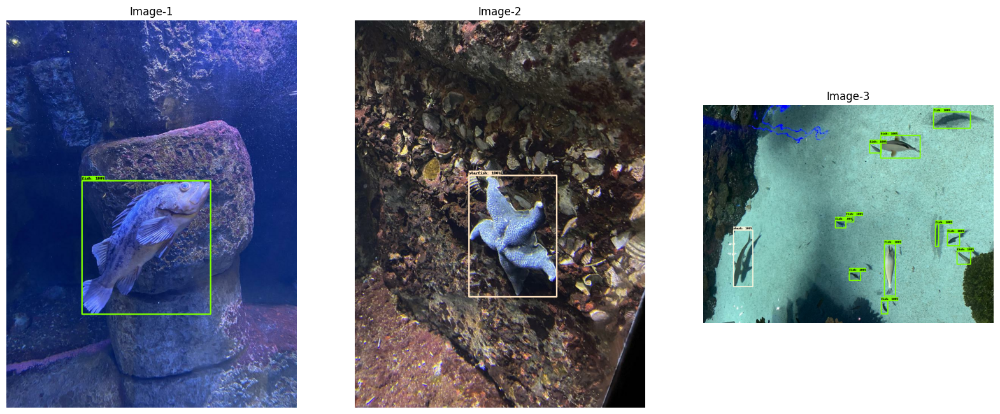

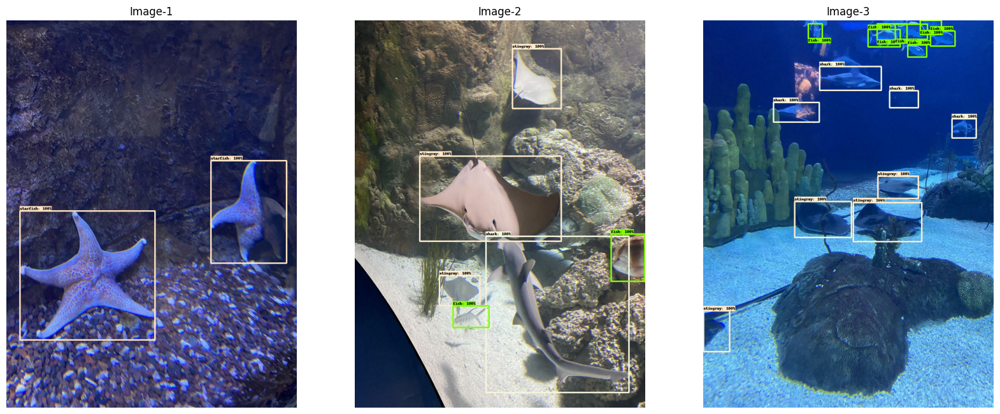

In [ ]:
buffer_size = 20
num_of_examples = 3

raw_records = tf.data.TFRecordDataset(
    exp_config.task.train_data.input_path).shuffle(
        buffer_size=buffer_size).take(num_of_examples)
show_batch(raw_records, num_of_examples)

show_batch(raw_records, num_of_examples)

###Train and evaluate.
We follow the COCO challenge tradition to evaluate the accuracy of object detection based on mAP(mean Average Precision). Please check here for detail explanation of how evaluation metrics for detection task is done.

IoU: is defined as the area of the intersection divided by the area of the union of a predicted bounding box and ground truth bounding box.

It May take while for 100 epochs.

In [ ]:
model, eval_logs = tfm.core.train_lib.run_experiment(
    distribution_strategy=distribution_strategy,
    task=task,
    mode='train_and_eval',
    params=exp_config,
    model_dir=model_dir,
    run_post_eval=True)


restoring or initializing model...
train | step:      0 | training until step 100...
train | step:    100 | steps/sec:    1.2 | output: 
    {'box_loss': 0.02299292,
     'cls_loss': 0.70729965,
     'learning_rate': 0.09755283,
     'model_loss': 1.8569458,
     'total_loss': 2.5598838,
     'training_loss': 2.5598838}
saved checkpoint to ./trained_model/ckpt-100.
 eval | step:    100 | running 100 steps of evaluation...
creating index...
index created!
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=2.12s).
Accumulating evaluation results...
DONE (t=0.23s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium |

###Load logs in tensorboard.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir './trained_model/'


<IPython.core.display.Javascript object>

###Saving and exporting the trained model.
The keras.Model object returned by train_lib.run_experiment expects the data to be normalized by the dataset loader using the same mean and variance statiscics in preprocess_ops.normalize_image(image, offset=MEAN_RGB, scale=STDDEV_RGB). This export function handles those details, so you can pass tf.uint8 images and get the correct results.

In [ ]:
print(export_dir)
export_dir = '/content/gdrive/MyDrive/models/aquarium'

./exported_model/


In [ ]:
export_saved_model_lib.export_inference_graph(
    input_type='image_tensor',
    batch_size=1,
    input_image_size=[HEIGHT, WIDTH],
    params=exp_config,
    checkpoint_path=tf.train.latest_checkpoint(model_dir),
    export_dir=export_dir)


###Inference from trained model

In [ ]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  image = None
  if(path.startswith('http')):
    response = urlopen(path)
    image_data = response.read()
    image_data = BytesIO(image_data)
    image = Image.open(image_data)
  else:
    image_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(image_data))

  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (1, im_height, im_width, 3)).astype(np.uint8)



def build_inputs_for_object_detection(image, input_image_size):
  """Builds Object Detection model inputs for serving."""
  image, _ = resize_and_crop_image(
      image,
      input_image_size,
      padded_size=input_image_size,
      aug_scale_min=1.0,
      aug_scale_max=1.0)
  return image


###Visualize test data.

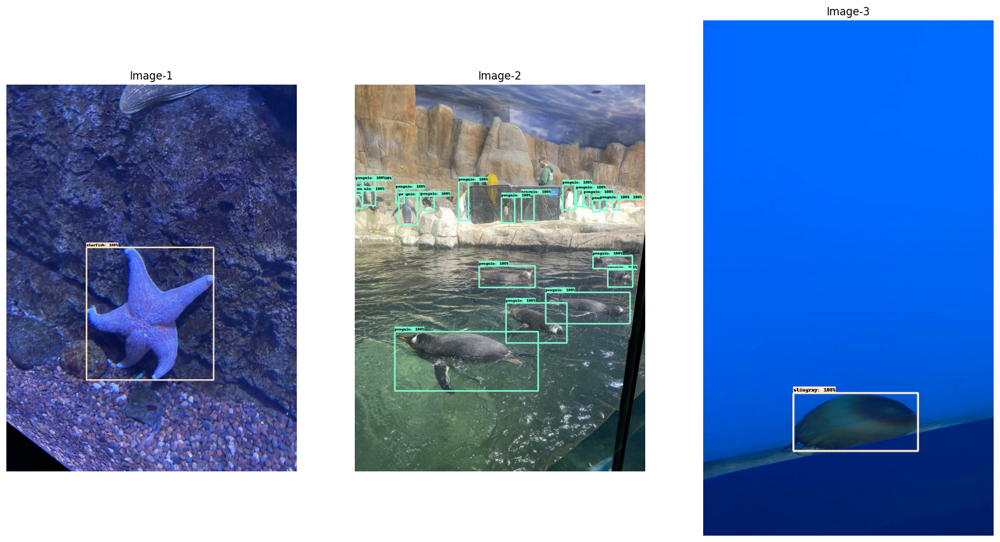

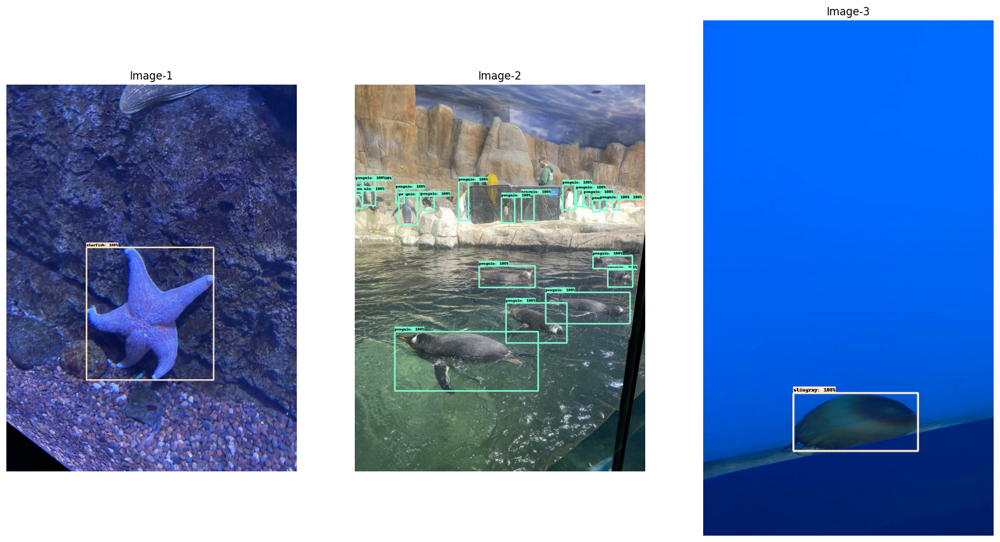

In [ ]:
num_of_examples = 3

test_ds = tf.data.TFRecordDataset(
    './aquarium_tfrecords/test-00000-of-00001.tfrecord').take(
        num_of_examples)
show_batch(test_ds, num_of_examples)
show_batch(test_ds, num_of_examples)

###Importing SavedModel.

In [ ]:
imported = tf.saved_model.load(export_dir)
model_fn = imported.signatures['serving_default']


###Visualize predictions.

In [ ]:
input_image_size = (HEIGHT, WIDTH)
plt.figure(figsize=(20, 20))
min_score_thresh = 0.30 # Change minimum score for threshold to see all bounding boxes confidences.

for i, serialized_example in enumerate(test_ds):
  plt.subplot(1, 3, i+1)
  decoded_tensors = tf_ex_decoder.decode(serialized_example)
  image = build_inputs_for_object_detection(decoded_tensors['image'], input_image_size)
  image = tf.expand_dims(image, axis=0)
  image = tf.cast(image, dtype = tf.uint8)
  image_np = image[0].numpy()
  result = model_fn(image)
  visualization_utils.visualize_boxes_and_labels_on_image_array(
      image_np,
      result['detection_boxes'][0].numpy(),
      result['detection_classes'][0].numpy().astype(int),
      result['detection_scores'][0].numpy(),
      category_index=category_index,
      use_normalized_coordinates=False,
      max_boxes_to_draw=200,
      min_score_thresh=min_score_thresh,
      agnostic_mode=False,
      instance_masks=None,
      line_thickness=4)
  plt.imshow(image_np)
  plt.axis('off')

plt.show()
